In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
import pathlib
import pandas as pd
import re

from obc_syn import (
    KL_divergence_to_ideal,
    rectify_phases,
    fit_temperature,
    energy_fn,
    phase_to_bool,
)


result_dir = pathlib.Path("sweep_results/")

# No noise sweep results

In [ ]:
# Parse {gate_name}_ref{int(exclude_ref_energy)}_Kc{Kc}_Kl{Kl}_anneal{int(anneal)}.pkl

pattern = re.compile(
    r"(?P<gate_name>.+)_ref(?P<exclude_ref_energy>[01])_Kc(?P<Kc>[\d.]+)_Kl(?P<Kl>[\d.]+)_anneal(?P<anneal>[01])\.pkl"
)

plotted_w_ref_energy, plotted_wo_ref_energy = False, False
data_labels = [
    "gate",
    "exclude_ref_energy",
    "Kc",
    "Kl",
    "anneal",
    "w_ref_beta",
    "w_ref_kl_div",
    "wo_ref_beta",
    "wo_ref_kl_div",
    "kl_div_to_ideal",
]
all_data = []
for file in sorted(result_dir.glob("*.pkl")):
    match = pattern.match(file.name)
    if not match:
        print(f"Filename {file.name} does not match expected pattern, skipping.")
        continue

    gate_name = match.group("gate_name")
    exclude_ref_energy = bool(int(match.group("exclude_ref_energy")))
    Kc = float(match.group("Kc"))
    Kl = float(match.group("Kl"))
    anneal = bool(int(match.group("anneal")))

    with open(file, "rb") as f:
        data = pickle.load(f)

    hist = data["hist"]
    w_ref_energy_data = data["w_ref_energy_data"]
    wo_ref_energy_data = data["wo_ref_energy_data"]

    w_ref_beta, w_ref_kl_div = w_ref_energy_data["beta"], w_ref_energy_data[
        "kl_div"
    ] / np.log(2)
    wo_ref_beta, wo_ref_kl_div = wo_ref_energy_data["beta"], wo_ref_energy_data[
        "kl_div"
    ] / np.log(2)

    w_ref_distribution = w_ref_energy_data["distribution"]
    w_ref_phase_to_energy = {k: -w_ref_distribution[k] for k in w_ref_distribution}
    kl_div_to_ideal = KL_divergence_to_ideal(w_ref_phase_to_energy, hist)

    all_data.append(
        [
            gate_name,
            exclude_ref_energy,
            Kc,
            Kl,
            anneal,
            w_ref_beta,
            w_ref_kl_div,
            wo_ref_beta,
            wo_ref_kl_div,
            kl_div_to_ideal,
        ]
    )

    if (exclude_ref_energy and not plotted_wo_ref_energy) or (
        not exclude_ref_energy and not plotted_w_ref_energy
    ):

        # Plot histogram
        plt.figure()

        plt.bar(
            range(len(hist)), hist.values(), tick_label=[str(k) for k in hist.keys()]
        )
        plt.title(
            f"Histogram for {gate_name} (Kc={Kc}, Kl={Kl}, anneal={anneal}, exclude_ref_energy={exclude_ref_energy})"
        )
        plt.xlabel("Input/Output Combination")
        plt.ylabel("Count")
        plt.xticks(rotation=90)
        plt.tight_layout()

        for label, p2e, color, data in zip(
            ["w/ Ref energy", "w/o Ref energy"],
            [w_ref_energy_data, wo_ref_energy_data],
            ["orange", "gold"],  # contrast to blue bars
            [w_ref_energy_data, wo_ref_energy_data],
        ):
            beta, kl_div, distribution = (
                data["beta"],
                data["kl_div"],
                data["distribution"],
            )
            # Plot the fitted distribution as a line on top of the histogram
            plt.plot(
                range(len(hist)),
                [distribution[k] for k in hist.keys()],
                label=f"{label}, beta={beta:.2f}, KL Div={kl_div:.4f}",
                marker="o",
                color=color,
            )
        plt.legend()
        plt.show()

    if exclude_ref_energy:
        plotted_wo_ref_energy = True
    if not exclude_ref_energy:
        plotted_w_ref_energy = True


all_data_df = pd.DataFrame(all_data, columns=data_labels)

In [ ]:
beta_w_ref, beta_wo_ref = all_data_df["w_ref_beta"], all_data_df["wo_ref_beta"]
beta_corr = beta_w_ref.corr(beta_wo_ref)
plt.figure()
plt.scatter(beta_w_ref, beta_wo_ref)
plt.xlabel("Beta w/ Ref Energy")
plt.ylabel("Beta w/o Ref Energy")
plt.title(f"Correlation of Beta w/ and w/o Ref Energy: {beta_corr:.4f}")
plt.grid()
plt.show()

Analyze the far right isolated region

In [ ]:
w_ref_data_greater_2_df = all_data_df[all_data_df["w_ref_beta"] > 2.0]
print(w_ref_data_greater_2_df.describe())

# show all the gate types in the subset
# print(w_ref_data_greater_2_df["gate"].value_counts())

# show all the exclude_ref_energy in the subset
print(w_ref_data_greater_2_df["exclude_ref_energy"].value_counts())


w_ref_beta_le_2_df = all_data_df[all_data_df["w_ref_beta"] <= 2.0]
print(w_ref_beta_le_2_df[w_ref_beta_le_2_df["gate"] == "2-OR"].describe())
print(
    w_ref_beta_le_2_df[w_ref_beta_le_2_df["gate"] == "2-OR"][
        "exclude_ref_energy"
    ].value_counts()
)

In [ ]:
# Color the (col1, col2) scatter points based on gate type
# and marker style based on exclude_ref_energy
# Separate the legend for gate type and exclude_ref_energy


def plot_scatter_with_gate_ref_energy_legend(x, y, x_label, y_label, title):
    plt.figure()
    markers = {True: "^", False: "x"}
    colors = plt.cm.get_cmap("tab10", len(all_data_df["gate"].unique()))
    for igate, gate in enumerate(all_data_df["gate"].unique()):
        gate_data = all_data_df[all_data_df["gate"] == gate]
        for exclude_ref_energy in [True, False]:
            gate_data_subset = gate_data[
                gate_data["exclude_ref_energy"] == exclude_ref_energy
            ]
            plt.scatter(
                gate_data_subset[x],
                gate_data_subset[y],
                marker=markers[exclude_ref_energy],
                color=colors(igate),
            )
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.title(title)
    # Add legend for gate types
    handles = [
        plt.Line2D([0], [0], label=gate, color=colors(i), markersize=10)
        for i, gate in enumerate(all_data_df["gate"].unique())
    ]
    # Add legend for exclude_ref_energy
    handles += [
        plt.Line2D(
            [0],
            [0],
            marker=markers[ex],
            color="w",
            label=f"{'Exclude' if ex else 'Include'} Ref Energy",
            markerfacecolor="k",
            markersize=10,
        )
        for ex in [True, False]
    ]
    plt.legend(handles=handles)
    plt.grid()
    plt.show()


plot_scatter_with_gate_ref_energy_legend(
    "w_ref_beta",
    "wo_ref_beta",
    "Beta w/ Ref Energy",
    "Beta w/o Ref Energy",
    "Beta w/ and w/o Ref Energy",
)
plot_scatter_with_gate_ref_energy_legend(
    "w_ref_kl_div",
    "wo_ref_kl_div",
    "KL-Divergence w/ Ref Energy",
    "KL-Divergence w/o Ref Energy",
    "KL-Divergence w/ and w/o Ref Energy",
)
plot_scatter_with_gate_ref_energy_legend(
    "w_ref_beta",
    "w_ref_kl_div",
    "Beta w/ Ref Energy",
    "KL-Divergence w/ Ref Energy",
    "Beta vs KL-Divergence w/ Ref Energy",
)
plot_scatter_with_gate_ref_energy_legend(
    "wo_ref_beta",
    "wo_ref_kl_div",
    "Beta w/o Ref Energy",
    "KL-Divergence w/o Ref Energy",
    "Beta vs KL-Divergence w/o Ref Energy",
)

In [ ]:
# Compare average KL divergence for with and without reference energy
# when synthesis is done with and without reference energy
include_ref_energy_df = all_data_df[~all_data_df["exclude_ref_energy"]]
exclude_ref_energy_df = all_data_df[all_data_df["exclude_ref_energy"]]


for title, df in zip(
    ["Synthesis Include Reference Energy", "Synthesis Exclude Reference Energy"],
    [include_ref_energy_df, exclude_ref_energy_df],
):
    print(f"\n{title}")
    print(df[["w_ref_kl_div", "w_ref_beta", "wo_ref_kl_div", "wo_ref_beta"]].describe())

The results are weird. Why is energy calculated with reference energy more accurate whether synthesis is done w/ or w/o reference energy?

In [ ]:
# Plot heatmap of one metric across Kc and Kl


def compare_anneal_heatmap_with_divergence_beta(df, title):
    # Plot 4 subplots: (1) Anneal=True, metric=KL Divergence; (2) Anneal=False, metric=KL Divergence; (3) Anneal=True, metric=Beta; (4) Anneal=False, metric=Beta
    # Subplot 1 and 2 share colorbar; Subplot 3 and 4 share colorbar
    metrics = ["w_ref_kl_div", "w_ref_beta", "kl_div_to_ideal"]
    for i, metric in enumerate(metrics):
        fig, axs = plt.subplots(1, 2, figsize=(10, 6))

        # Configure vmin and vmax for color scale based on metric
        df_w_anneal, df_wo_anneal = df[df["anneal"]], df[~df["anneal"]]
        vmin = min(df_w_anneal[metric].min(), df_wo_anneal[metric].min())
        vmax = max(df_w_anneal[metric].max(), df_wo_anneal[metric].max())
        for j, anneal in enumerate([True, False]):
            subset_df = df[df["anneal"] == anneal]
            pivot_table = subset_df.pivot_table(index="Kl", columns="Kc", values=metric)
            ax = axs[j]
            cax = ax.imshow(
                pivot_table,
                origin="lower",
                aspect="auto",
                cmap="viridis",
                vmin=vmin,
                vmax=vmax,
            )
            ax.set_title(
                f"{title} - {'Anneal' if anneal else 'No Anneal'} - {metric.removeprefix('w_ref_')}"
            )
            ax.set_xlabel("Kc")
            ax.set_ylabel("Kl")
            ax.set_xticks(ticks=np.arange(len(pivot_table.columns)))
            ax.set_xticklabels(
                labels=[f"{k:.2f}" for k in pivot_table.columns], rotation=90
            )
            ax.set_yticks(ticks=np.arange(len(pivot_table.index)))
            ax.set_yticklabels(labels=[f"{k:.2f}" for k in pivot_table.index])

        fig.subplots_adjust(right=0.8)
        cbar_ax = fig.add_axes([1.0, 0.15, 0.05, 0.7])
        fig.colorbar(cax, cax=cbar_ax)

        plt.tight_layout()
        plt.show()


df_include_ref = all_data_df[~all_data_df["exclude_ref_energy"]]
for gate in df_include_ref["gate"].unique():
    subset_df = df_include_ref[(df_include_ref["gate"] == gate)]
    compare_anneal_heatmap_with_divergence_beta(subset_df, f"{gate}")

# With noise

In [3]:
import jax.numpy as jnp
import jax
from itertools import product
from IPython.display import HTML
import matplotlib.animation as animation
from tqdm.notebook import tqdm

jax.config.update("jax_enable_x64", True)

In [4]:
# Parse  {gate_name}_Kc{Kc}_Kl{Kl}_t_end{t_end}.pkl"
# They are actually npz files with wrong extesnsion postfix

result_dir_noisy = result_dir / "noisy"
pattern = re.compile(
    r"(?P<gate_name>.+)_Kc(?P<Kc>[\d.]+)_Kl(?P<Kl>[\d.]+)_t_end(?P<t_end>[\d.]+)\.npz"
)

gates = {
    "2-OR": [lambda x, y, z: (x | y) == z, 3, 0],
    "2-AND": [lambda x, y, z: (x & y) == z, 3, 0],
    "2-XOR": [lambda x, y, z: (x ^ y) == z, 3, 1],
    "3-OR": [lambda x, y, z, a: (x | y | z) == a, 4, 1],
    "1-ADDER": [lambda a0, b0, s0, c: ((a0 ^ b0) == s0 and (a0 & b0) == c), 4, 1],
}
Kl_values = np.linspace(0, 2, 5, endpoint=True)
t_ends = [5, 10, 20]

ISING_PHASES = [-1, 1]
FIXED_OSCS = [1]
N_SUBSAMPLES = 100

all_data = {
    gate_name: {Kl: {t_end: {} for t_end in t_ends} for Kl in Kl_values}
    for gate_name in gates.keys()
}
for file in tqdm(sorted(result_dir_noisy.glob("*.npz"))):
    match = pattern.match(file.name)
    if not match:
        print(f"Filename {file.name} does not match expected pattern, skipping.")
        continue

    gate_name = match.group("gate_name")
    Kc = float(match.group("Kc"))
    Kl = float(match.group("Kl"))
    t_end = float(match.group("t_end"))
    gate_fn, n_io_var, n_aux_var = gates[gate_name]
    io_val_tab = [list(v) for v in product(*[ISING_PHASES for _ in range(n_io_var)])]
    aux_val_tab = [list(v) for v in product(*[ISING_PHASES for _ in range(n_aux_var)])]

    with open(file, "rb") as f:
        data = jnp.load(f)

        traces = data["traces"]
        J_mat = data["J"]
        ts = data["ts"]

    all_data[gate_name][Kl][t_end]["traces"] = traces
    all_data[gate_name][Kl][t_end]["J"] = J_mat
    all_data[gate_name][Kl][t_end]["ts"] = ts

    # Check if processed data has been processed
    process_file_npz = file.with_suffix(".processed.npz")
    if process_file_npz.exists():
        with open(process_file_npz, "rb") as f:
            processed_data = jnp.load(f, allow_pickle=True)

            print(process_file_npz)
            all_data[gate_name][Kl][t_end]["hist_t"] = processed_data["hist_t"]
            all_data[gate_name][Kl][t_end]["beta_t"] = processed_data["beta_t"]
            all_data[gate_name][Kl][t_end]["kl_div_t"] = processed_data["kl_div_t"]
            all_data[gate_name][Kl][t_end]["kl_div_to_ideal_t"] = processed_data[
                "kl_div_to_ideal_t"
            ]
        continue

    phase_to_energy_w_ref = {}
    for ios_phase in io_val_tab:
        for aux_vals in aux_val_tab:
            v = np.array(ios_phase + aux_vals + FIXED_OSCS)
            phase_to_energy_w_ref[tuple(phase_to_bool(ios_phase + aux_vals))] = (
                energy_fn(J_mat, v, exclude_ref_energy=False)
            )

    # Find the fitted temperature, Kl divergence from fitted boltzmann, and KL divergence to ideal over time
    traces = traces.swapaxes(0, 1).swapaxes(0, 2)  # shape (time, samples, vars)
    hist_t, beta_t, kl_div_t = [], [], []
    kl_div_to_ideal_t = []

    subsample_idxs = np.linspace(0, traces.shape[0] - 1, N_SUBSAMPLES, dtype=int)
    traces = traces[subsample_idxs, :, :]
    ts = ts[subsample_idxs]

    for all_phases_at_t in traces:
        n_var = all_phases_at_t.shape[1]
        rectified_phases = jax.vmap(rectify_phases, in_axes=(0, None))(
            all_phases_at_t, 2
        )

        hist = {
            tuple(phase_to_bool(list(p))): 0
            for p in product(*[ISING_PHASES for _ in range(n_var)])
        }
        for res in rectified_phases:
            key = tuple([int(bool(p)) for p in res])
            hist[key] += 1

        beta, kl_div, _ = fit_temperature(phase_to_energy_w_ref, hist)
        kl_div_to_ideal = KL_divergence_to_ideal(
            phase_to_energy_w_ref, hist, n_io_var=n_io_var
        )
        hist_t.append(hist)
        beta_t.append(beta)
        kl_div_t.append(kl_div)
        kl_div_to_ideal_t.append(kl_div_to_ideal)

    all_data[gate_name][Kl][t_end]["hist_t"] = hist_t
    all_data[gate_name][Kl][t_end]["beta_t"] = beta_t
    all_data[gate_name][Kl][t_end]["kl_div_t"] = kl_div_t
    all_data[gate_name][Kl][t_end]["kl_div_to_ideal_t"] = kl_div_to_ideal_t

    # Save processed data to npz file
    process_file_npz = file.with_suffix(".processed.npz")
    with open(process_file_npz, "wb") as f:
        jnp.savez(
            f,
            traces=traces,
            J=J_mat,
            ts=ts,
            hist_t=hist_t,
            beta_t=beta_t,
            kl_div_t=kl_div_t,
            kl_div_to_ideal_t=kl_div_to_ideal_t,
        )

  0%|          | 0/231 [00:00<?, ?it/s]

sweep_results/noisy/1-ADDER_Kc1_Kl0.0_t_end10.processed.npz
Filename 1-ADDER_Kc1_Kl0.0_t_end10.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl0.0_t_end20.processed.npz
Filename 1-ADDER_Kc1_Kl0.0_t_end20.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl0.0_t_end5.processed.npz
Filename 1-ADDER_Kc1_Kl0.0_t_end5.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl0.5_t_end10.processed.npz
Filename 1-ADDER_Kc1_Kl0.5_t_end10.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl0.5_t_end20.processed.npz
Filename 1-ADDER_Kc1_Kl0.5_t_end20.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl0.5_t_end5.processed.npz
Filename 1-ADDER_Kc1_Kl0.5_t_end5.processed.npz does not match expected pattern, skipping.
sweep_results/noisy/1-ADDER_Kc1_Kl1.0_t_end10.processed.npz
Filename 1-ADDER_Kc1_Kl1.0_t_end

In [5]:
# f"sweep_results/noisy/{gate_name}_Kc{Kc}_Kl{Kl}_t_end{t_end}_Kt{Kt}_Kt_ratio{Kt_ratio}.npz"
all_data = {
    gate_name: {Kl: {t_end: {} for t_end in t_ends} for Kl in Kl_values}
    for gate_name in gates.keys()
}
pattern = re.compile(
    r"(?P<gate_name>.+)_Kc(?P<Kc>[\d.]+)_Kl(?P<Kl>[\d.]+)_t_end(?P<t_end>[\d.]+)_Kt(?P<Kt>[\d.]+)_Kt_ratio(?P<Kt_ratio>[\d.]+)\.npz"
)

for file in tqdm(sorted(result_dir_noisy.glob("*.npz"))):
    match = pattern.match(file.name)
    if not match:
        # print(f"Filename {file.name} does not match expected pattern, skipping.")
        continue

    gate_name = match.group("gate_name")

    if gate_name == "1-ADDER":
        # Skip 1-ADDER for this analysis
        continue
    Kc = float(match.group("Kc"))
    Kl = float(match.group("Kl"))
    t_end = float(match.group("t_end"))
    Kt = float(match.group("Kt"))
    Kt_ratio = float(match.group("Kt_ratio"))
    gate_fn, n_io_var, n_aux_var = gates[gate_name]
    io_val_tab = [list(v) for v in product(*[ISING_PHASES for _ in range(n_io_var)])]
    aux_val_tab = [list(v) for v in product(*[ISING_PHASES for _ in range(n_aux_var)])]

    all_data[gate_name][Kl][(t_end, Kt, Kt_ratio)] = {}
    all_data_at_kt_ktr = all_data[gate_name][Kl][(t_end, Kt, Kt_ratio)]

    with open(file, "rb") as f:
        data = jnp.load(f)

        traces = data["traces"]
        J_mat = data["J"]
        ts = data["ts"]

    all_data_at_kt_ktr["traces"] = traces
    all_data_at_kt_ktr["J"] = J_mat
    all_data_at_kt_ktr["ts"] = ts

    # Check if processed data has been processed
    process_file_npz = file.with_suffix(".processed.npz")
    if process_file_npz.exists():
        with open(process_file_npz, "rb") as f:
            processed_data = jnp.load(f, allow_pickle=True)

            print(process_file_npz)
            all_data_at_kt_ktr["hist_t"] = processed_data["hist_t"]
            all_data_at_kt_ktr["beta_t"] = processed_data["beta_t"]
            all_data_at_kt_ktr["kl_div_t"] = processed_data["kl_div_t"]
            all_data_at_kt_ktr["kl_div_to_ideal_t"] = processed_data[
                "kl_div_to_ideal_t"
            ]
        continue

    phase_to_energy_w_ref = {}
    for ios_phase in io_val_tab:
        for aux_vals in aux_val_tab:
            v = np.array(ios_phase + aux_vals + FIXED_OSCS)
            phase_to_energy_w_ref[tuple(phase_to_bool(ios_phase + aux_vals))] = (
                energy_fn(J_mat, v, exclude_ref_energy=False)
            )

    # Find the fitted temperature, Kl divergence from fitted boltzmann, and KL divergence to ideal over time
    traces = traces.swapaxes(0, 1).swapaxes(0, 2)  # shape (time, samples, vars)
    hist_t, beta_t, kl_div_t = [], [], []
    kl_div_to_ideal_t = []

    subsample_idxs = np.linspace(0, traces.shape[0] - 1, N_SUBSAMPLES, dtype=int)
    traces = traces[subsample_idxs, :, :]
    ts = ts[subsample_idxs]

    for all_phases_at_t in traces:
        n_var = all_phases_at_t.shape[1]
        rectified_phases = jax.vmap(rectify_phases, in_axes=(0, None))(
            all_phases_at_t, 2
        )

        hist = {
            tuple(phase_to_bool(list(p))): 0
            for p in product(*[ISING_PHASES for _ in range(n_var)])
        }
        for res in rectified_phases:
            key = tuple([int(bool(p)) for p in res])
            hist[key] += 1

        beta, kl_div, _ = fit_temperature(phase_to_energy_w_ref, hist)
        kl_div_to_ideal = KL_divergence_to_ideal(
            phase_to_energy_w_ref, hist, n_io_var=n_io_var
        )
        hist_t.append(hist)
        beta_t.append(beta)
        kl_div_t.append(kl_div)
        kl_div_to_ideal_t.append(kl_div_to_ideal)

    all_data_at_kt_ktr["hist_t"] = hist_t
    all_data_at_kt_ktr["beta_t"] = beta_t
    all_data_at_kt_ktr["kl_div_t"] = kl_div_t
    all_data_at_kt_ktr["kl_div_to_ideal_t"] = kl_div_to_ideal_t

    # Save processed data to npz file
    process_file_npz = file.with_suffix(".processed.npz")
    with open(process_file_npz, "wb") as f:
        jnp.savez(
            f,
            traces=traces,
            J=J_mat,
            ts=ts,
            hist_t=hist_t,
            beta_t=beta_t,
            kl_div_t=kl_div_t,
            kl_div_to_ideal_t=kl_div_to_ideal_t,
        )

  0%|          | 0/231 [00:00<?, ?it/s]

sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio100.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio10000.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio1000000.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.1_Kt_ratio100.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.1_Kt_ratio10000.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt0.1_Kt_ratio1000000.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt1_Kt_ratio100.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt1_Kt_ratio10000.0.processed.npz
sweep_results/noisy/2-AND_Kc1_Kl1_t_end100_Kt1_Kt_ratio1000000.0.processed.npz
sweep_results/noisy/2-OR_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio100.0.processed.npz
sweep_results/noisy/2-OR_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio10000.0.processed.npz
sweep_results/noisy/2-OR_Kc1_Kl1_t_end100_Kt0.01_Kt_ratio1000000.0.processed.npz
sweep_results/noisy/2-OR_Kc1_Kl1_t_end100_Kt0.1_Kt_rati

In [6]:
from typing import List, Mapping, Optional, Sequence, Union
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

FrameLike = Union[Mapping[str, float], "pd.Series"]  # pandas optional


def animate_bars(
    frames: List[FrameLike],
    tick_colors: Optional[Mapping[str, str]] = None,
    time_labels: Optional[Sequence[str]] = None,
    figsize=(7, 4),
    y_pad_ratio: float = 0.10,
    fps: int = 6,
):
    """
    Animate a bar chart where each frame describes category → value at a time step.

    Parameters
    ----------
    frames : list of dict/Series
        Each element maps 'category' -> numeric value for that time step.
    time_labels : list of str, optional
        Labels for each frame (e.g., timestamps). If None, uses "t=0,1,..."
    figsize : tuple
        Matplotlib figure size.
    y_pad_ratio : float
        Extra headroom on y-axis as a fraction of max value.
    fps : int
        Frames per second for the animation.

    Returns
    -------
    anim : FuncAnimation
        The matplotlib animation object.
    """

    if len(frames) == 0:
        raise ValueError("`frames` must contain at least one element.")

    # Convert the "tuple keys" in frames to strings
    for i in range(len(frames)):
        frames[i] = {str(k): v for k, v in frames[i].items()}

    # Collect full label set across all frames (missing values default to 0)
    all_labels = set()
    for f in frames:
        all_labels.update(list(f.keys()))
    labels = sorted(list(all_labels))

    # Build data matrix: [n_frames, n_labels]
    data = np.array(
        [[float(frames[t].get(lbl, 0.0)) for lbl in labels] for t in range(len(frames))]
    )
    n_frames, n_labels = data.shape

    # Time labels
    if time_labels is None:
        time_labels = [f"t={t}" for t in range(n_frames)]
    if len(time_labels) != n_frames:
        raise ValueError("`time_labels` length must match number of frames.")

    # Figure and initial bars
    fig, ax = plt.subplots(figsize=figsize)
    bars = ax.bar(labels, data[0], align="center")
    ax.set_ylim(0, max(1e-12, data.max()) * (1.0 + y_pad_ratio))
    ax.set_ylabel("Value")
    ax.set_title(time_labels[0])
    ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels

    if tick_colors:
        # Color the tick labels based on provided mapping
        for tick_label in ax.get_xticklabels():
            lbl_text = tick_label.get_text()
            if lbl_text in tick_colors:
                tick_label.set_color(tick_colors[lbl_text])

    # For efficient blitting, return the artists we update each frame
    artists = list(bars)

    def init():
        # Set initial heights/labels
        for rect, v in zip(bars, data[0]):
            rect.set_height(v)
        ax.set_title(time_labels[0])
        return artists

    def update(frame_idx):
        # Update bar heights and value labels
        vals = data[frame_idx]
        ymax = max(1e-12, vals.max(), data.max()) * (1.0 + y_pad_ratio)
        ax.set_ylim(0, ymax)
        for rect, v in zip(bars, vals):
            rect.set_height(v)
        ax.set_title(time_labels[frame_idx])
        return artists

    interval_ms = int(1000 / max(1, fps))
    anim = FuncAnimation(
        fig,
        update,
        frames=n_frames,
        init_func=init,
        interval=interval_ms,
        blit=True,
        repeat=False,
    )
    plt.tight_layout()

    plt.close()  # avoid duplicate static figure display in notebooks
    return anim

In [7]:
def visualize_data(
    gate_name: str,
    Kc: float,
    Kl: float,
    t_end: float,
    Kt: Optional[float] = None,
    Kt_ratio: Optional[float] = None,
):
    if Kt is not None and Kt_ratio is not None:
        if (t_end, Kt, Kt_ratio) not in all_data[gate_name][Kl]:
            print(
                f"No data found for {gate_name} with Kl={Kl}, t_end={t_end}, Kt={Kt}, Kt_ratio={Kt_ratio}"
            )
            print("Available keys:", all_data[gate_name][Kl].keys())
            return
        data = all_data[gate_name][Kl][(t_end, Kt, Kt_ratio)]
    else:
        data = all_data[gate_name][Kl][t_end]
    traces = data["traces"]
    J_mat = data["J"]
    ts = data["ts"]
    hist_t = data["hist_t"]
    hist = hist_t[0]
    beta_t = data["beta_t"]
    kl_div_t = data["kl_div_t"]
    kl_div_to_ideal_t = data["kl_div_to_ideal_t"]

    traces = traces.swapaxes(0, 1).swapaxes(0, 2)  # shape (time, samples, vars)

    subsample_idxs = np.linspace(0, traces.shape[0] - 1, N_SUBSAMPLES, dtype=int)
    traces = traces[subsample_idxs, :, :]
    ts = ts[subsample_idxs]

    gate_fn, n_io_var, n_aux_var = gates[gate_name]

    print(J_mat)

    fig, axs = plt.subplots(2, 1, figsize=(6, 6))
    ln1 = axs[0].plot(ts, beta_t, marker="o", label="Fitted Beta")
    axs[0].set_xlabel("Time")
    axs[0].set_ylabel("Fitted Beta")
    ax2 = axs[0].twinx()
    ln2 = ax2.plot(ts, kl_div_t, marker="x", color="orange", label="KL Divergence")
    ax2.set_ylabel("# of Bits")
    lns = ln1 + ln2
    labels = [l.get_label() for l in lns]
    axs[0].legend(lns, labels)

    ln3 = axs[1].plot(
        ts,
        kl_div_to_ideal_t,
        marker="s",
        color="green",
        label="KL Divergence to Ideal",
    )
    axs[1].set_xlabel("Time")
    axs[1].set_ylabel("# of Bits")
    axs[1].legend()

    plt.suptitle(f"{gate_name} (Kc={Kc}, Kl={Kl}, t_end={t_end})")
    plt.tight_layout()
    plt.show()

    tick_colors = {}
    for phases in hist.keys():
        if isinstance(phases, str):
            phases_tuple = eval(phases)
        else:
            phases_tuple = phases
        io_phases = phases_tuple[:n_io_var]
        if gate_fn(*io_phases):
            tick_colors[str(phases_tuple)] = "red"
        else:
            tick_colors[str(phases_tuple)] = "black"

    # Plot the histograms as an animation over time with HTML display

    anim = animate_bars(
        frames=hist_t,
        tick_colors=tick_colors,
        time_labels=[f"t={t:.2f}" for t in ts],
    )
    return anim

[[ 0  1 -2  1]
 [ 1  0 -2  1]
 [-2 -2  0 -2]
 [ 1  1 -2  0]]


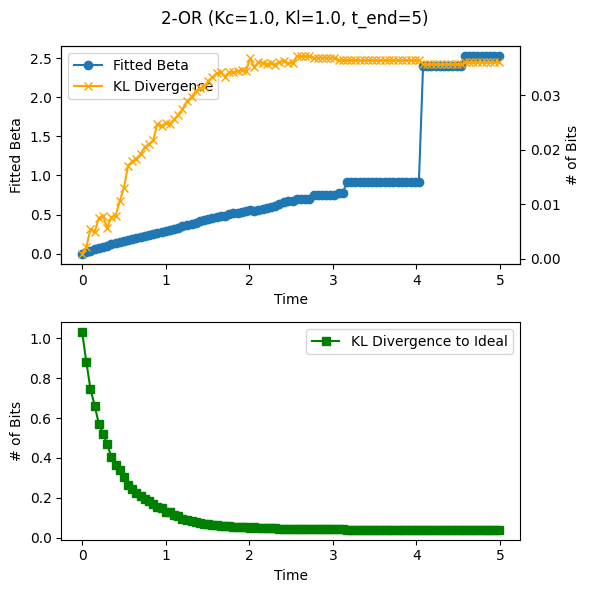

/var/folders/zv/1cq_05k97dl9b9_kf_drhmdr0000gp/T/ipykernel_71814/1039501826.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels


In [106]:
anim = visualize_data(
    gate_name="2-OR",
    Kc=1.0,
    Kl=1.0,
    t_end=5,
)
HTML(anim.to_jshtml())

[[ 0  1 -2 -1]
 [ 1  0 -2 -1]
 [-2 -2  0  2]
 [-1 -1  2  0]]


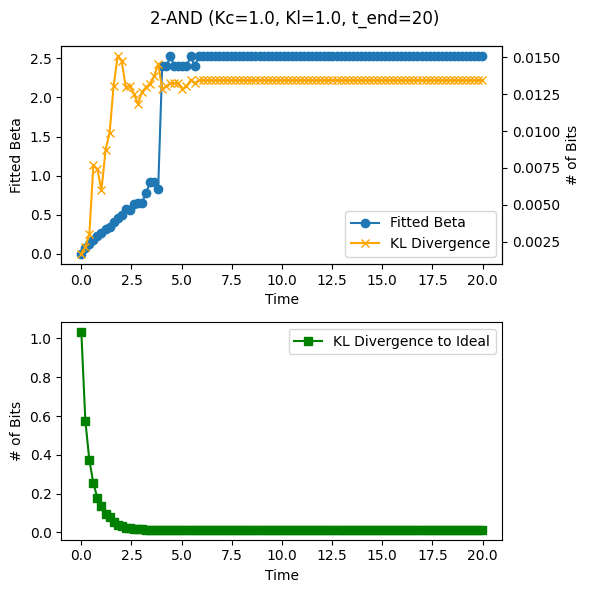

/var/folders/zv/1cq_05k97dl9b9_kf_drhmdr0000gp/T/ipykernel_71814/1039501826.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels


In [112]:
anim = visualize_data(
    gate_name="2-AND",
    Kc=1.0,
    Kl=1.0,
    t_end=20,
)
HTML(anim.to_jshtml())  # JS-based HTML (works well inline)

[[ 0  1  1 -2 -3 -1]
 [ 1  0  1 -2 -3 -1]
 [ 1  1  0 -2 -3 -1]
 [-2 -2 -2  0  4  0]
 [-3 -3 -3  4  0  3]
 [-1 -1 -1  0  3  0]]


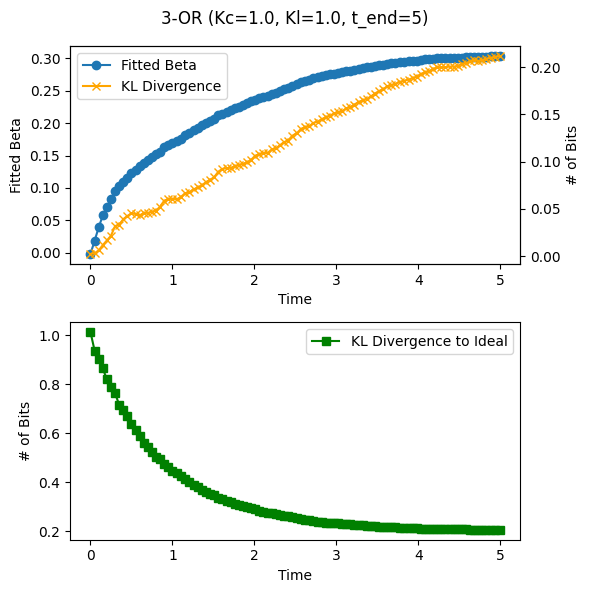

/var/folders/zv/1cq_05k97dl9b9_kf_drhmdr0000gp/T/ipykernel_71814/1039501826.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels


In [111]:
anim = visualize_data(
    gate_name="3-OR",
    Kc=1.0,
    Kl=1.0,
    t_end=5,
)
HTML(anim.to_jshtml())

[[ 0  1 -2  1]
 [ 1  0 -2  1]
 [-2 -2  0 -2]
 [ 1  1 -2  0]]


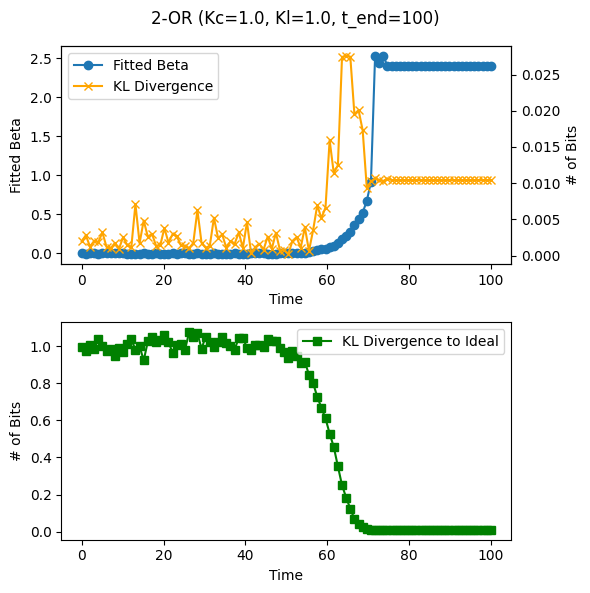

/var/folders/zv/1cq_05k97dl9b9_kf_drhmdr0000gp/T/ipykernel_89091/1039501826.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels


In [19]:
anim = visualize_data(
    gate_name="2-OR",
    Kc=1.0,
    Kl=1.0,
    t_end=100,
    Kt=0.01,
    Kt_ratio=1e6,
)
HTML(anim.to_jshtml())

[[ 0  1  1 -2 -3 -1]
 [ 1  0  1 -2 -3 -1]
 [ 1  1  0 -2 -3 -1]
 [-2 -2 -2  0  4  0]
 [-3 -3 -3  4  0  3]
 [-1 -1 -1  0  3  0]]


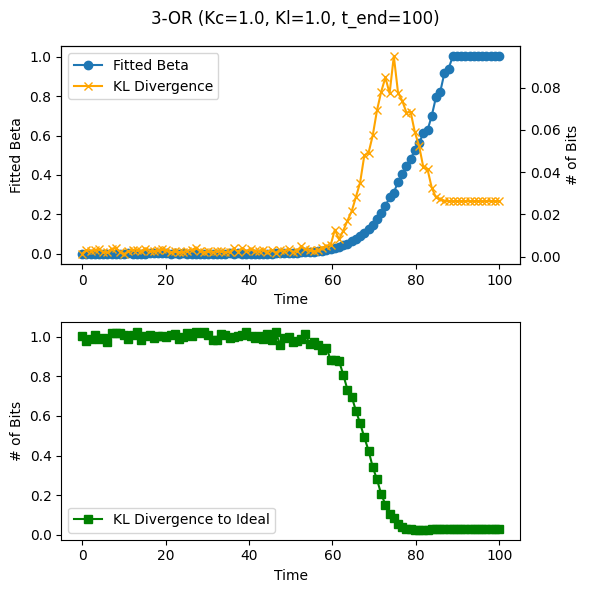

/var/folders/zv/1cq_05k97dl9b9_kf_drhmdr0000gp/T/ipykernel_89091/1039501826.py:71: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels, rotation=90)  # adjust if you want angled labels


In [23]:
anim = visualize_data(
    gate_name="3-OR",
    Kc=1.0,
    Kl=1.0,
    t_end=100,
    Kt=0.1,
    Kt_ratio=1e4,
)
HTML(anim.to_jshtml())